### Notebook to train the background Kernel Density Estimates for Bayesian inference 

In [1]:
%matplotlib inline
from sklearn.neighbors.kde import KernelDensity
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea

import pickle as p

In [2]:
#read in the combined photometric data. Set this catalog to the output from the catalog combine step:
catalog = pd.read_csv('n3115_phot_combined.csv')

### Select only detections

In [3]:
#only use data selcted with all three filters with no flags
all_detected = (catalog['g_mag'] < 90) & (catalog['r_mag'] < 90) & (catalog['i_mag'] < 90) & \
    (catalog['g_flags'] < 1) & (catalog['r_flags'] < 1) & (catalog['i_flags'] < 1)

all_detections = catalog.ix[all_detected,:]


### Correct for FG Extinction 

In [4]:
#also need to correct for FG extinction. Take values from NASA NED:
fg_g = 0.153
fg_r = 0.106
fg_i = 0.079

all_detections ['g_mag'] = all_detections['g_mag'] - fg_g
all_detections ['r_mag'] = all_detections['r_mag'] - fg_r
all_detections ['i_mag'] = all_detections['i_mag'] - fg_i

/Users/zjennings/anaconda/envs/astro/lib/python3.5/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/zjennings/anaconda/envs/astro/lib/python3.5/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/zjennings/anaconda/envs/astro/lib/python3.5/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: h

#### First, make color-cuts just to cut down to defined region

Cuts include a cut down to the standard "defined" color region.

In [5]:
#these values can be changed, but should usually correspond to the area over 
#which the FG KDE is defined (at least for final analysus)
gi_max = 1.7
gi_min = -0.2
ri_max = 1.0
ri_min = -0.2

color_cut = all_detections.ix[((all_detections['g_mag'] - all_detections['i_mag']) < gi_max) & \
                           ((all_detections['g_mag'] - all_detections['i_mag']) > gi_min) & \
                           ((all_detections['r_mag'] - all_detections['i_mag']) < ri_max) & \
                           ((all_detections['r_mag'] - all_detections['i_mag']) > ri_min),:]

#### Make plots of magnitude vs FWHM for all filters to identify which filter has the best seeing.
May need to adjust plot limits. Iterate on the values selected for the saturation limit and the FWHM bounds using these plots.

In [6]:
#saturation limits for all 3 filters
g_bright = 17.5
r_bright = 18.
i_bright = 17.

In [7]:
#fwhm bounds. set the catalog key to use for cutting fwhm, and then 
#also set the filter number so it shows up in the correct plot
fwhm_key = 'i_fwhm'
fwhm_min = 2.5
fwhm_max = 3.2
filt_number = 2

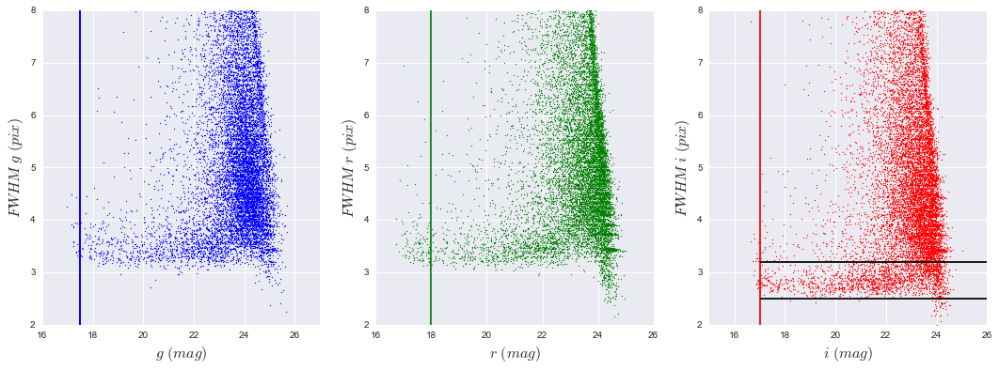

In [8]:
fig,ax = plt.subplots(1,3,figsize=(18,6))
ax[0].scatter(color_cut['g_mag'],color_cut['g_fwhm'],color='b',s=1)
ax[0].set_xlim(16,27)
ax[0].set_ylim(2,8)
ax[0].set_xlabel(r'$g\ (mag)$',fontsize=16)
ax[0].set_ylabel(r'$FWHM\ g\ (pix)$',fontsize=16)
ax[0].vlines(g_bright,2,8,color='b')
ax[0].vlines(g_bright,2,8,color='b')
ax[0].hlines

ax[1].scatter(color_cut['r_mag'],color_cut['r_fwhm'],color='g',s=1)
ax[1].set_xlim(16,26)
ax[1].set_ylim(2,8)
ax[1].set_xlabel(r'$r\ (mag)$',fontsize=16)
ax[1].set_ylabel(r'$FWHM\ r\ (pix)$',fontsize=16)
ax[1].vlines(r_bright,2,8,color='g')


ax[2].scatter(color_cut['i_mag'],color_cut['i_fwhm'],color='r',s=1)
ax[2].set_xlim(15,26)
ax[2].set_ylim(2,8)
ax[2].set_xlabel(r'$i\ (mag)$',fontsize=16)
ax[2].set_ylabel(r'$FWHM\ i\  (pix)$',fontsize=16)
ax[2].vlines(i_bright,2,8,color='r')

ax[filt_number].hlines([fwhm_max,fwhm_min],17,26,color='black')

#### Decide on the merr limits for all filters.
I think 0.1 merr is reasonable, but we may want to modify this.

In [9]:
g_merr_lim = 0.2
r_merr_lim = 0.2
i_merr_lim = 0.2


In [10]:
clean_data = all_detections.ix[
    ((all_detections[fwhm_key] < fwhm_max) &
    (all_detections[fwhm_key] > fwhm_min) &
    (all_detections['g_merr'] < g_merr_lim) &
    (all_detections['r_merr'] < r_merr_lim) &
    (all_detections['i_merr'] < i_merr_lim) &
    (all_detections['g_mag'] > g_bright) &
    (all_detections['r_mag'] > r_bright) &
    (all_detections['i_mag'] > i_bright)),:]

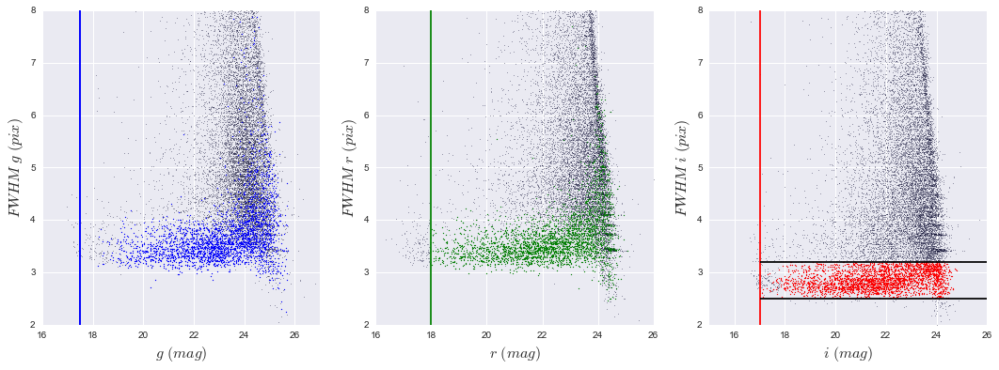

In [11]:
fig,ax = plt.subplots(1,3,figsize=(18,6))
ax[0].scatter(all_detections['g_mag'],all_detections['g_fwhm'],s=0.1)
ax[0].scatter(clean_data['g_mag'],clean_data['g_fwhm'],color='b',s=1)
ax[0].set_xlim(16,27)
ax[0].set_ylim(2,8)
ax[0].set_xlabel(r'$g\ (mag)$',fontsize=16)
ax[0].set_ylabel(r'$FWHM\ g\ (pix)$',fontsize=16)
ax[0].vlines(g_bright,2,8,color='b')
ax[0].vlines(g_bright,2,8,color='b')
ax[0].hlines


ax[1].scatter(all_detections['r_mag'],all_detections['r_fwhm'],s=0.1)
ax[1].scatter(clean_data['r_mag'],clean_data['r_fwhm'],color='g',s=1)
ax[1].set_xlim(16,26)
ax[1].set_ylim(2,8)
ax[1].set_xlabel(r'$r\ (mag)$',fontsize=16)
ax[1].set_ylabel(r'$FWHM\ r\ (pix)$',fontsize=16)
ax[1].vlines(r_bright,2,8,color='g')

ax[2].scatter(all_detections['i_mag'],all_detections['i_fwhm'],s=0.1)
ax[2].scatter(clean_data['i_mag'],clean_data['i_fwhm'],color='r',s=1)
ax[2].set_xlim(15,26)
ax[2].set_ylim(2,8)
ax[2].set_xlabel(r'$i\ (mag)$',fontsize=16)
ax[2].set_ylabel(r'$FWHM\ i\  (pix)$',fontsize=16)
ax[2].vlines(i_bright,2,8,color='r')

ax[filt_number].hlines([fwhm_max,fwhm_min],17,26,color='black')

#### Read in the KDE and plot it to get a sense of how the data match the FG KDE 

In [12]:
#train a 2D kernel density estimate
kd = p.load(open('../final_fg_distribution/ngvs_bg_trimmed_kde_full_bw.05_seeing_.7_xl.p','rb'),encoding='latin1')

In [13]:
#score the KDE samples over a meshgrid
X, Y = np.meshgrid(np.arange(-0.5,2.01,0.01),np.arange(-0.5,1.01,0.01))
xy = np.vstack([X.ravel(), Y.ravel()]).T

scores=np.exp(kd.score_samples(xy))
Z = scores.reshape(X.shape)
levels = np.linspace(0, Z.max(), 50)

(-0.2, 1.0)

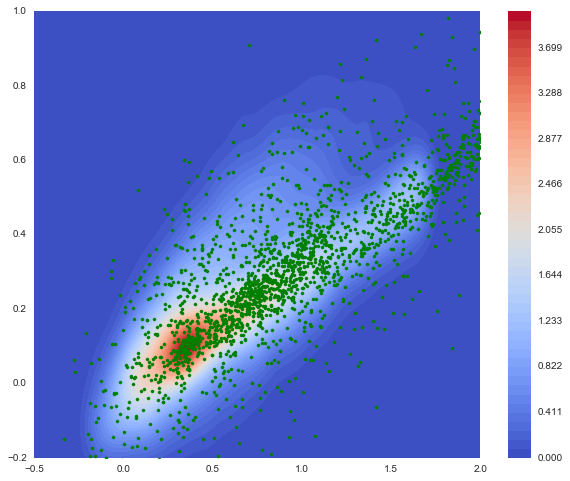

In [14]:
fig,ax = plt.subplots(figsize=(10,8))
contour = ax.contourf(X, Y, Z, levels=levels, cmap='coolwarm')
ax.scatter(clean_data['g_mag']-clean_data['i_mag']+0.09,
           clean_data['r_mag']-clean_data['i_mag']+0.02,s=10.,color='green')
plt.colorbar(contour)
ax.set_xlim(-0.5,2.0)
ax.set_ylim(-0.2,1.0)

In [15]:
colors = np.vstack([clean_data['g_mag'] - clean_data['i_mag']+0.07,  clean_data['r_mag'] - clean_data['i_mag']+0.02]).T

In [16]:
data_kde = KernelDensity(0.03)
data_kde.fit(colors)

KernelDensity(algorithm='auto', atol=0, bandwidth=0.03, breadth_first=True,
       kernel='gaussian', leaf_size=40, metric='euclidean',
       metric_params=None, rtol=0)

In [17]:
data_scores =np.exp(data_kde.score_samples(xy))
data_Z = data_scores.reshape(X.shape)

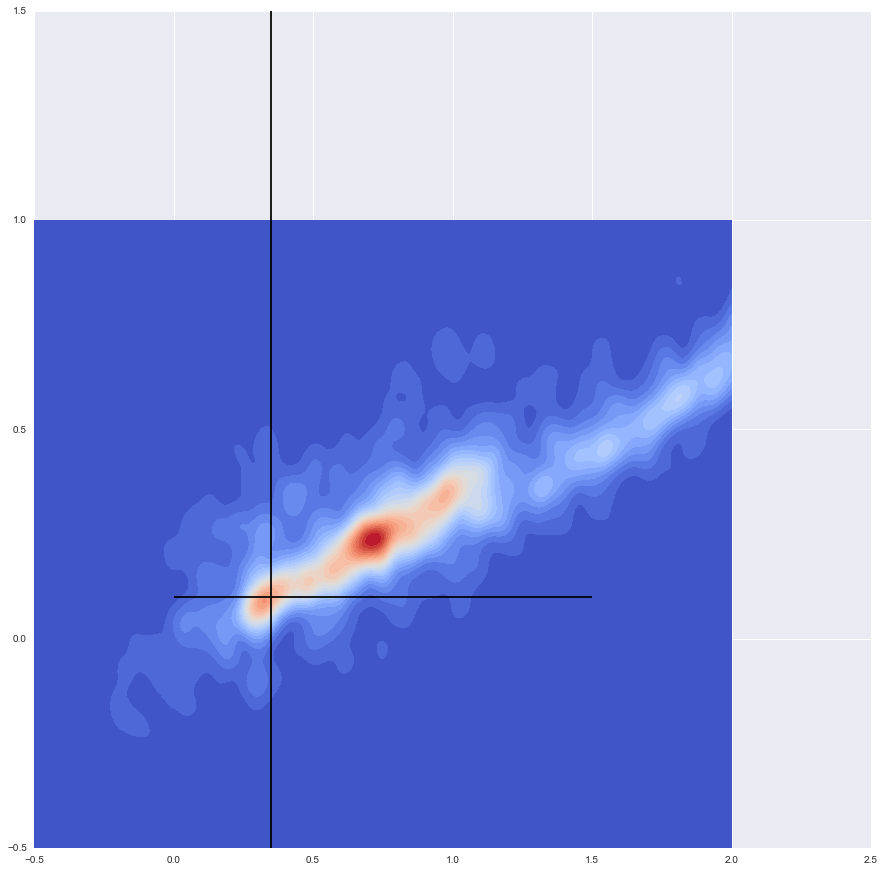

In [18]:
fig,ax = plt.subplots(figsize=(15,15))
data_levels = np.linspace(0, data_Z.max(), 25)

contour = ax.contourf(X, Y, data_Z, levels=data_levels, cmap='coolwarm')
#ax.scatter(all_detections['g_mag']-all_detections['i_mag']+0.2,
#           all_detections['r_mag']-all_detections['i_mag'],s=5.,color='green')
#plt.colorbar(contour)
ax.set_xlim(-0.5,2.5)
ax.set_ylim(-0.5,1.5)
ax.vlines(0.35,ymin=-0.5,ymax=1.5)
ax.hlines(0.1,xmin=0.0,xmax=1.5)

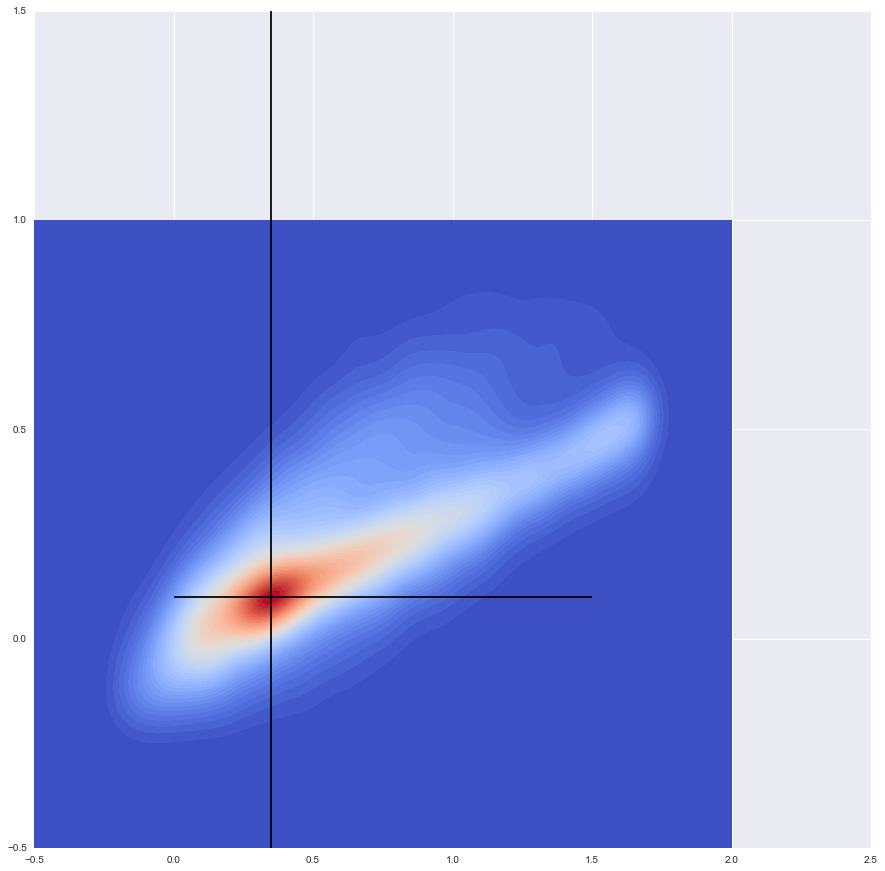

In [19]:
fig,ax = plt.subplots(figsize=(15,15))
contour = ax.contourf(X, Y, Z, levels=levels, cmap='coolwarm')
i_off = 0.0
#ax.scatter(clean_data['g_mag']-(clean_data['i_mag']),
#           clean_data['r_mag']-(clean_data['i_mag']),s=3.,color='green')
#plt.colorbar(contour)
ax.set_xlim(-0.5,2.5)
ax.set_ylim(-0.5,1.5)
ax.vlines(0.35,ymin=-0.5,ymax=1.5)
ax.hlines(0.1,xmin=0.0,xmax=1.5)

#### Decide on the bounds on the FWHM values for point-sources.
Note which filter these bounds apply to in the FWHM key (we only want to use the filter with the best seeing to decide whether sources are point like).

#### Apply cuts to the data to get a cleaned sample 

(array([  2.93500000e+03,   2.84900000e+03,   2.28200000e+03,
          1.94600000e+03,   1.73800000e+03,   1.59500000e+03,
          1.39300000e+03,   1.07400000e+03,   7.87000000e+02,
          5.57000000e+02,   3.81000000e+02,   2.16000000e+02,
          1.23000000e+02,   5.50000000e+01,   3.10000000e+01,
          2.50000000e+01,   1.30000000e+01,   1.00000000e+01,
          5.00000000e+00,   3.00000000e+00,   2.00000000e+00,
          3.00000000e+00,   1.00000000e+00,   1.00000000e+00,
          1.00000000e+00,   0.00000000e+00,   1.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   1.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   1.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          1.00000000e+00,   0.00000000e+00,   0.00000000e+00,
        

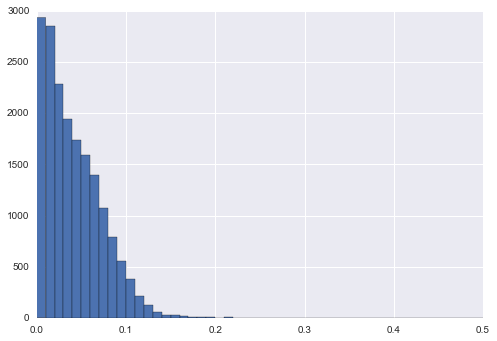

In [20]:
plt.hist(catalog['i_merr'],range=(0,0.5),bins=50)

## Bayesian GC Population Inference 

In [21]:
%matplotlib inline
import matplotlib.pyplot as plt
import scipy.stats as stats
import scipy
#import fakeGalaxy
#reload(fakeGalaxy)
import numpy as np
import seWrapper
import gcSampler
import densityGC
import densityFG
import subprocess as sp
import SourceCompleteness
import corner
import pickle
import truncMVN
from importlib import reload

reload(seWrapper)
reload(gcSampler)
reload(densityGC)
reload(densityFG)
reload(SourceCompleteness)
reload(truncMVN.truncMVN)
import emcee

/Users/zjennings/anaconda/envs/astro/lib/python3.5/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
/Users/zjennings/anaconda/envs/astro/lib/python3.5/site-packages/sklearn/grid_search.py:43: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


In [22]:
c_ra = 151.308250   
c_dec = -7.718583

distance = np.sqrt((clean_data['ra'] - c_ra)**2 + (clean_data['dec']-c_dec)**2)
#fwhm = data['fwhm_world']

In [23]:
def cut_line(x,gi_slope,ri_int):
    return x * gi_slope + ri_int

In [24]:
gi = clean_data['g_mag'] - clean_data['i_mag']
ri = clean_data['r_mag'] - clean_data['i_mag']

gi_off = 0.09
ri_off =0.025
gi = gi + gi_off
ri = ri + ri_off
g = (gi > -0.2) & (gi < 1.7) & \
    (ri > -0.2) & (ri < 1.0) & (distance < 0.25) & \
    (ri > cut_line(gi,0.45,-0.4)) & \
    (ri < cut_line(gi,0.7,0.27))

(-0.2, 1.0)

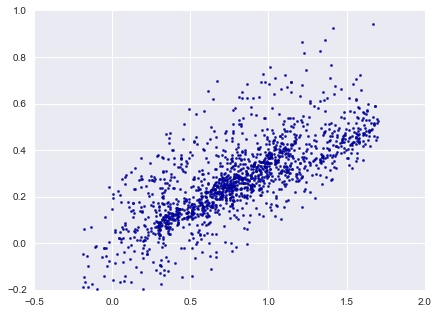

In [25]:
fig, ax = plt.subplots(figsize=(7,5))
ax.scatter(gi[g],ri[g],s=5.0)
ax.set_xlim(-0.5,2.0)
ax.set_ylim(-0.2,1.0)

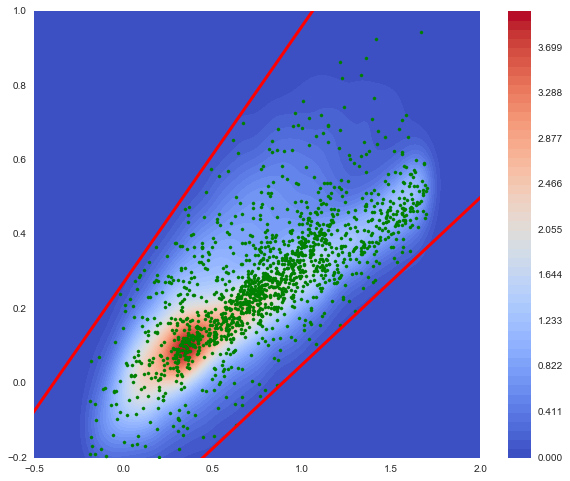

In [26]:
fig,ax = plt.subplots(figsize=(10,8))
contour = ax.contourf(X, Y, Z, levels=levels, cmap=plt.cm.coolwarm)
#ax.scatter(all_detections['g_mag'] - all_detections['i_mag'],all_detections['r_mag']-all_detections['i_mag'],
#           s=3.0,color='pink')
#ax.scatter(size_1['g_mag'] - size_1['i_mag'],size_1['r_mag']-size_1['i_mag'],
#           s=5.0,color='pink')
ax.scatter(gi[g],ri[g],
           s=10.0,color='green')
plt.colorbar(contour)
ax.set_xlim(-0.5,2.0)
ax.set_ylim(-0.2,1.0)
x_range = np.arange(-5,3.,0.1)
plt.plot(x_range,cut_line(x_range,0.45,-0.4),linewidth=3,color='r')
plt.plot(x_range,cut_line(x_range,0.69,0.27),linewidth=3,color='r')

In [27]:
good_colors = np.array([gi[g],ri[g]])
good_coords = np.vstack([clean_data['ra'][g],clean_data['dec'][g]])
good_lum = clean_data['i_mag'][g]

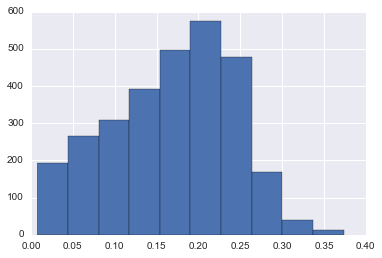

In [28]:
hist = plt.hist(distance,bins=10)

In [29]:
c_blue = np.array([-0.2,-0.2])
c_red = np.array([1.7,1.0])

In [30]:
print(good_coords.shape)
print(good_lum.shape)

(2, 1506)
(1506,)


In [31]:
cat = (good_colors.T,good_lum,good_coords)

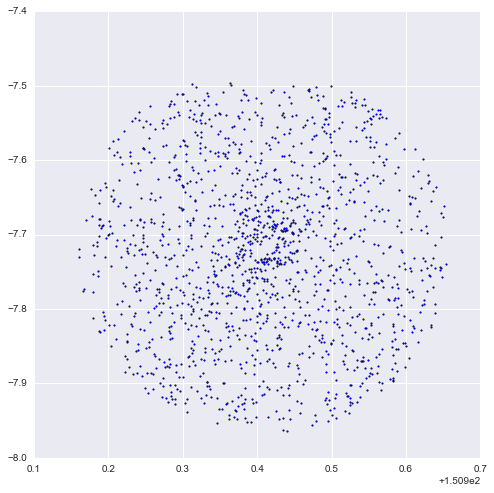

In [32]:
fig,ax = plt.subplots(figsize=(8,8))
ax.scatter(good_coords[0,:],good_coords[1,:],s=3.)

#### First, run sampler in single-mode to see how well one mode pops out of data.  

In [33]:
reload(gcSampler)
reload(densityGC)
reload(densityFG)

gc_sampler_nospace_single_mode = gcSampler.gcSampler(100.,catalog=cat,\
                fractions=np.array([0.5,0.5]),center=[c_ra,c_dec],spatial=np.array([0.1]),\
                  max_rad=0.25,radial_profile=None,mock=False,n_source=1000,ellipticity=False,\
                         n_pop=1,fixed_cov=False,fixed_means=False,fixed_lum=True,lum_function=None,
                         completeness=None,fg_faint=24.,incomplete=False,
                        fg_kde_file='../final_fg_distribution/ngvs_bg_trimmed_kde_full_bw.05_seeing_.7_xl.p',
                         fg_bright=18.,lum_mean=np.array([23.]),lum_sig=np.array([1.5]),\
                               gi_offset=0.0,ri_offset=0.0,c_blue=c_blue,c_red=c_red,re_norm=True,gi_divide=0.95,\
                                        ri_divide=0.28,const_fg_density=False)#,means=np.array([[1.1,0.33],[0.6,0.19]]))

In [34]:
gc_sampler_nospace_single_mode.runSampler(1000.,burn_steps=0.)

/Users/zjennings/google_drive_personal/gc_select/gcSampler.py:740: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  self.chain=self.sampler.chain[:,burn_steps:,:]
/Users/zjennings/google_drive_personal/gc_select/gcSampler.py:761: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  flat_chain = self.chain[:,n_burn:,:].reshape(-1,self.n_dim)


/Users/zjennings/anaconda/envs/astro/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


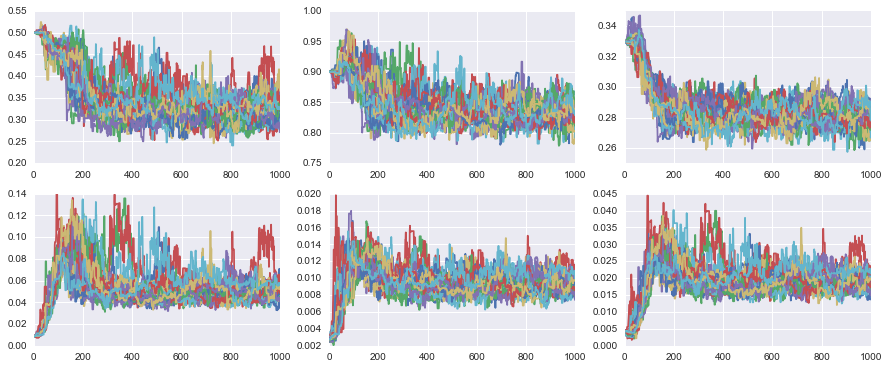

In [35]:
fig,ax = plt.subplots(figsize=(15,6),ncols=3,nrows=2,dpi=1000)

for i in range(gc_sampler_nospace_single_mode.n_dim):
    for j in range(30):
        ax[i/3,i%3].plot(gc_sampler_nospace_single_mode.sampler.chain[j+30,:,i])

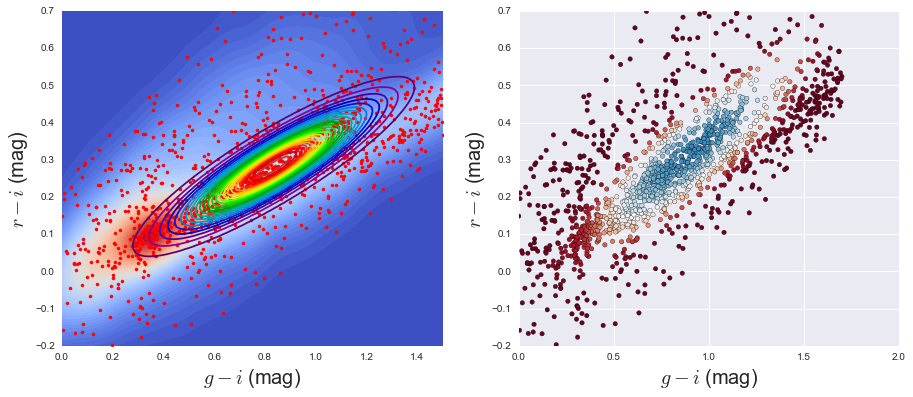

In [36]:
nburn = 600
sampler = gc_sampler_nospace_single_mode
chain = sampler.chain
mean_red = np.array([np.median(chain[:,nburn:,1].reshape(-1,100)),np.median(chain[:,nburn:,2].reshape(-1,100))])

cov_red = np.matrix([[np.median(chain[:,nburn:,3].reshape(-1,100)),np.median(chain[:,nburn:,5].reshape(-1,100))],
                   [np.median(chain[:,nburn:,5].reshape(-1,100)),np.median(chain[:,nburn:,4].reshape(-1,100))]])

red_pdf = stats.multivariate_normal(mean=mean_red,cov=cov_red)

red_probs = red_pdf.pdf(xy)
red_max = red_pdf.pdf(mean_red)

red_levels = np.linspace(0, red_max, 25)


fig,ax = plt.subplots(1,2,figsize=(15,6))
red_contours = red_probs.reshape(X.shape)
#blue_contours = blue_probs.reshape(X.shape)
contour = ax[0].contour(X, Y, red_contours, levels=red_levels, cmap=plt.cm.spectral)
#contour = ax.contour(X, Y, blue_contours, levels=blue_levels, cmap=plt.cm.spectral)
contour = ax[0].contourf(X, Y, Z, levels=levels, cmap=plt.cm.coolwarm)

ax[0].set_xlim(0.0,1.5)
ax[0].set_ylim(-0.2,0.7)
ax[0].scatter(gi[g],ri[g],
           s=10.0,color='red')
ax[0].set_xlabel(r'$g-i$ (mag)',size=20)
ax[0].set_ylabel(r'$r-i$ (mag)',size=20)

ax[1].scatter(cat[0][:,0],cat[0][:,1],c=sampler.p_gc+1e-4,cmap='RdBu',vmax=1)
ax[1].set_xlim(0.0,2.0)
ax[1].set_ylim(-0.2,0.7)
ax[1].set_xlabel(r'$g-i$ (mag)',size=20)
ax[1].set_ylabel(r'$r-i$ (mag)',size=20)

In [334]:
#if desired, do a quick save of the chain to make it easier to analyze later
np.save('nospace_unimodal_chain.npy',sampler.chain)

In [335]:
chain = np.load('nospace_unimodal_chain.npy')

###  Bimodal fits, still no spatial information

In [342]:
reload(gcSampler)
reload(densityGC)
reload(densityFG)

gc_sampler_nospace_bimodal = gcSampler.gcSampler(100.,catalog=cat,\
                fractions=np.array([0.25,0.15,0.6]),center=[c_ra,c_dec],spatial=np.array([0.1]),\
                  max_rad=0.25,radial_profile=None,mock=False,n_source=1000,ellipticity=False,\
                         n_pop=2,fixed_cov=False,fixed_means=False,fixed_lum=True,lum_function=None,
                         completeness=None,fg_faint=24.,incomplete=False,
                        fg_kde_file='../final_fg_distribution/ngvs_bg_trimmed_kde_full_bw.05_seeing_.7_xl.p',
                         fg_bright=18.,lum_mean=np.array([23.]),lum_sig=np.array([1.5]),\
                               gi_offset=0.0,ri_offset=0.0,c_blue=c_blue,c_red=c_red,re_norm=True,gi_divide=0.85,\
                                        ri_divide=0.28,means=np.array([[1.00,0.4],[0.7,0.19]]))

In [343]:
gc_sampler_nospace_bimodal.runSampler(2000.,burn_steps=0.)

/Users/zjennings/google_drive_personal/gc_select/gcSampler.py:728: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  self.chain=self.sampler.chain[:,burn_steps:,:]
/Users/zjennings/google_drive_personal/gc_select/gcSampler.py:749: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  flat_chain = self.chain[:,n_burn:,:].reshape(-1,self.n_dim)


/Users/zjennings/anaconda/envs/astro/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


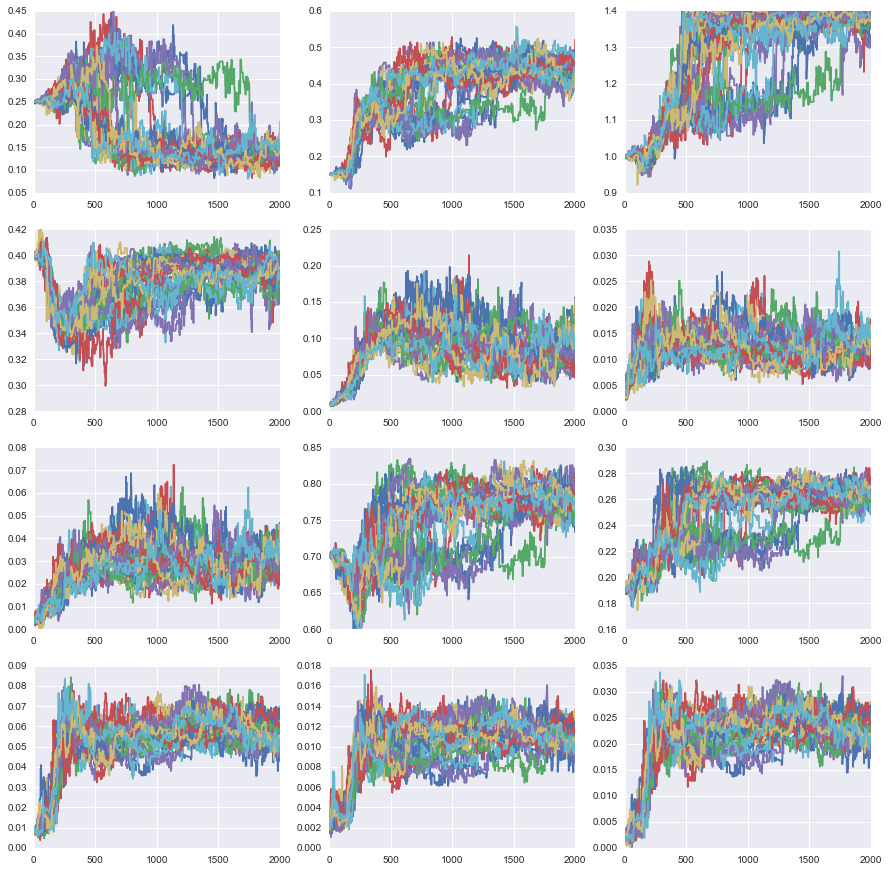

In [344]:
fig,ax = plt.subplots(figsize=(15,15),ncols=3,nrows=4,dpi=1000)

for i in range(gc_sampler_nospace_bimodal.n_dim):
    for j in range(30):
        ax[i/3,i%3].plot(gc_sampler_nospace_bimodal.sampler.chain[j,:,i])

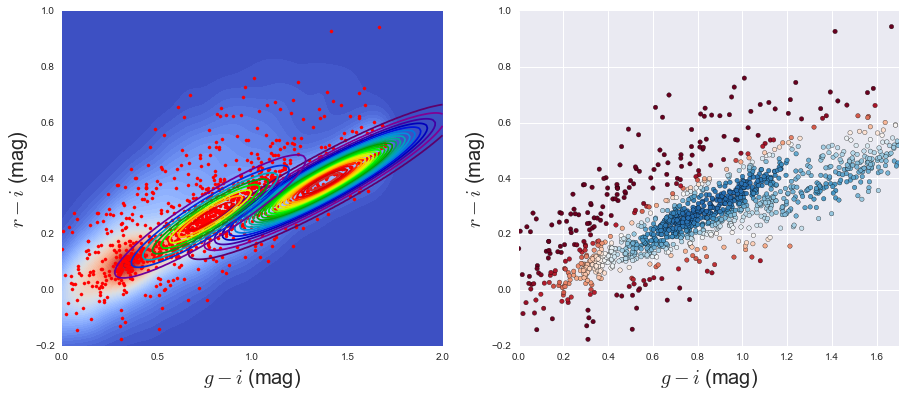

In [345]:
nburn = 1500
sampler = gc_sampler_nospace_bimodal
chain = sampler.chain
mean_red = np.array([np.median(chain[:,nburn:,2].reshape(-1,100)),np.median(chain[:,nburn:,3].reshape(-1,100))])
mean_blue = np.array([np.median(chain[:,nburn:,7].reshape(-1,100)),np.median(chain[:,nburn:,8].reshape(-1,100))])

cov_red = np.matrix([[np.median(chain[:,nburn:,4].reshape(-1,100)),np.median(chain[:,nburn:,6].reshape(-1,100))],
                   [np.median(chain[:,nburn:,6].reshape(-1,100)),np.median(chain[:,nburn:,5].reshape(-1,100))]])
cov_blue = np.matrix([[np.median(chain[:,nburn:,9].reshape(-1,100)),np.median(chain[:,nburn:,11].reshape(-1,100))],
                   [np.median(chain[:,nburn:,11].reshape(-1,100)),np.median(chain[:,nburn:,10].reshape(-1,100))]])

red_pdf = stats.multivariate_normal(mean=mean_red,cov=cov_red)
blue_pdf = stats.multivariate_normal(mean=mean_blue,cov=cov_blue)

red_probs = red_pdf.pdf(xy)
red_max = red_pdf.pdf(mean_red)
blue_probs = blue_pdf.pdf(xy)
blue_max = blue_pdf.pdf(mean_blue)
red_levels = np.linspace(0, red_max, 25)
blue_levels = np.linspace(0, blue_max, 10)

fig,ax = plt.subplots(1,2,figsize=(15,6))
red_contours = red_probs.reshape(X.shape)
blue_contours = blue_probs.reshape(X.shape)
contour = ax[0].contour(X, Y, red_contours, levels=red_levels, cmap=plt.cm.spectral)
contour = ax[0].contour(X, Y, blue_contours, levels=blue_levels, cmap=plt.cm.spectral)
contour = ax[0].contourf(X, Y, Z, levels=levels, cmap=plt.cm.coolwarm)

ax[0].set_xlim(0.0,2.0)
ax[0].set_ylim(-0.2,1.0)
ax[0].scatter(gi[g],ri[g],
           s=10.0,color='red')
ax[0].set_xlabel(r'$g-i$ (mag)',size=20)
ax[0].set_ylabel(r'$r-i$ (mag)',size=20)

ax[1].scatter(cat[0][:,0],cat[0][:,1],c=sampler.p_gc,cmap='RdBu',vmax=1)
ax[1].set_xlim(0.0,1.7)
ax[1].set_ylim(-0.2,1.0)
ax[1].set_xlabel(r'$g-i$ (mag)',size=20)
ax[1].set_ylabel(r'$r-i$ (mag)',size=20)

In [346]:
#if desired, do a quick save of the chain to make it easier to analyze later
np.save('nospace_bimodal_chain.npy',sampler.chain)

In [347]:
#if we want to analyze later, can read in the chain here:
chain = np.load('nospace_bimodal_chain.npy')

###  Unimodal Fit, now spatial information

In [354]:
reload(gcSampler)
reload(densityGC)
reload(densityFG)

gc_sampler_space_single_mode = gcSampler.gcSampler(100.,catalog=cat,\
                fractions=np.array([0.5,0.5]),center=[c_ra,c_dec],spatial=np.array([0.1]),\
                  max_rad=0.25,radial_profile='exponential',mock=False,n_source=1000,ellipticity=False,\
                         n_pop=1,fixed_cov=False,fixed_means=False,fixed_lum=True,lum_function=None,
                         completeness=None,fg_faint=24.,incomplete=False,
                        fg_kde_file='../final_fg_distribution/ngvs_bg_trimmed_kde_full_bw.05_seeing_.7_xl.p',
                         fg_bright=18.,lum_mean=np.array([23.]),lum_sig=np.array([1.5]),\
                               gi_offset=0.0,ri_offset=0.0,c_blue=c_blue,c_red=c_red,re_norm=True,gi_divide=0.77,\
                                        ri_divide=0.28)#,means=np.array([[0.9,0.33],[0.6,0.19]]))

In [355]:
gc_sampler_space_single_mode.runSampler(1000.,burn_steps=0.)

/Users/zjennings/google_drive_personal/gc_select/gcSampler.py:728: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  self.chain=self.sampler.chain[:,burn_steps:,:]
/Users/zjennings/google_drive_personal/gc_select/gcSampler.py:749: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  flat_chain = self.chain[:,n_burn:,:].reshape(-1,self.n_dim)


/Users/zjennings/anaconda/envs/astro/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


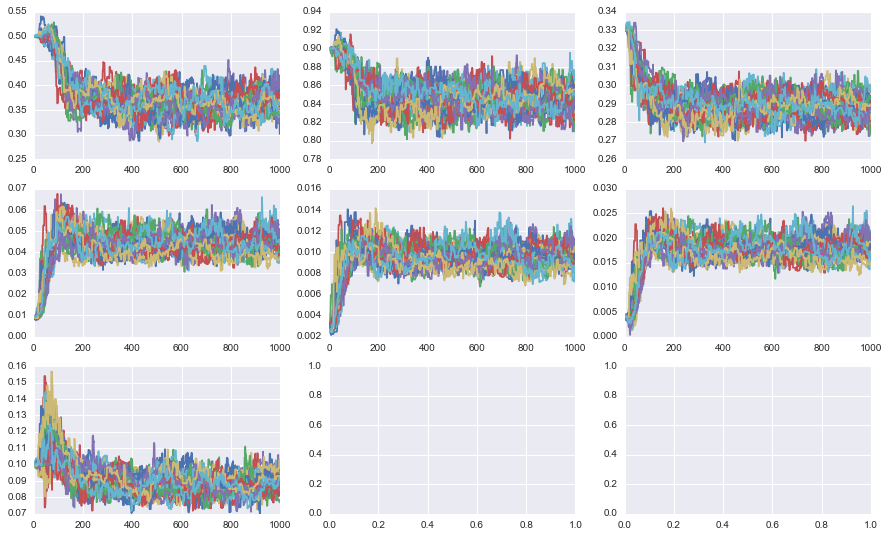

In [356]:
fig,ax = plt.subplots(figsize=(15,9),ncols=3,nrows=3,dpi=1000)

for i in range(gc_sampler_space_single_mode.n_dim):
    for j in range(30):
        ax[i/3,i%3].plot(gc_sampler_space_single_mode.sampler.chain[j+30,:,i])

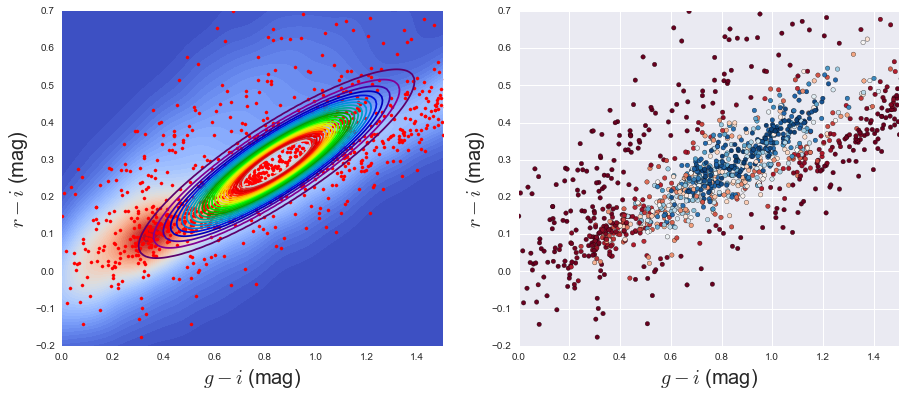

In [360]:
nburn = 600
sampler = gc_sampler_space_single_mode
chain = sampler.chain
mean_red = np.array([np.median(chain[:,nburn:,1].reshape(-1,100)),np.median(chain[:,nburn:,2].reshape(-1,100))])

cov_red = np.matrix([[np.median(chain[:,nburn:,3].reshape(-1,100)),np.median(chain[:,nburn:,5].reshape(-1,100))],
                   [np.median(chain[:,nburn:,5].reshape(-1,100)),np.median(chain[:,nburn:,4].reshape(-1,100))]])

red_pdf = stats.multivariate_normal(mean=mean_red,cov=cov_red)

red_probs = red_pdf.pdf(xy)
red_max = red_pdf.pdf(mean_red)

fig,ax = plt.subplots(1,2,figsize=(15,6))
red_contours = red_probs.reshape(X.shape)
blue_contours = blue_probs.reshape(X.shape)
contour = ax[0].contour(X, Y, red_contours, levels=red_levels, cmap=plt.cm.spectral)
contour = ax[0].contourf(X, Y, Z, levels=levels, cmap=plt.cm.coolwarm)

ax[0].set_xlim(0.0,1.5)
ax[0].set_ylim(-0.2,0.7)
ax[0].scatter(gi[g],ri[g],
           s=10.0,color='red')
ax[0].set_xlabel(r'$g-i$ (mag)',size=20)
ax[0].set_ylabel(r'$r-i$ (mag)',size=20)

ax[1].scatter(cat[0][:,0],cat[0][:,1],c=sampler.p_gc,cmap='RdBu',vmax=1)
ax[1].set_xlim(0.0,1.5)
ax[1].set_ylim(-0.2,0.7)
ax[1].set_xlabel(r'$g-i$ (mag)',size=20)
ax[1].set_ylabel(r'$r-i$ (mag)',size=20)

In [361]:
np.save('space_unimodal_chain.npy',sampler.chain)

In [362]:
chain = np.load('space_unimodal_chain.npy')

### Bimodal fit, now including spatial information 

In [615]:
reload(gcSampler)
reload(densityGC)
reload(densityFG)

gc_sampler_space_bimodal = gcSampler.gcSampler(100.,catalog=cat,\
                fractions=np.array([0.15,0.2,0.65]),center=[c_ra,c_dec],spatial=np.array([0.1]),\
                  max_rad=0.25,radial_profile='exponential',mock=False,n_source=1000,ellipticity=False,\
                         n_pop=2,fixed_cov=False,fixed_means=False,fixed_lum=True,lum_function=None,
                         completeness=None,fg_faint=24.,incomplete=False,
                        fg_kde_file='../final_fg_distribution/ngvs_bg_trimmed_kde_full_bw.05_seeing_.7_xl.p',
                         fg_bright=18.,lum_mean=np.array([23.]),lum_sig=np.array([1.5]),\
                               gi_offset=0.0,ri_offset=0.0,c_blue=c_blue,c_red=c_red,re_norm=True,gi_divide=0.9,\
                                        ri_divide=0.28,means=np.array([[1.0,0.33],[0.8,0.19]]),
                    cov=np.array([[[0.002, 0.0009],[0.0009, 0.001]],[[0.002, 0.001],[0.001,.001]]]))

In [616]:
gc_sampler_space_bimodal.runSampler(4000.,burn_steps=0.)

/Users/zjennings/google_drive_personal/gc_select/gcSampler.py:728: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  self.chain=self.sampler.chain[:,burn_steps:,:]
/Users/zjennings/google_drive_personal/gc_select/gcSampler.py:749: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  flat_chain = self.chain[:,n_burn:,:].reshape(-1,self.n_dim)


/Users/zjennings/anaconda/envs/astro/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


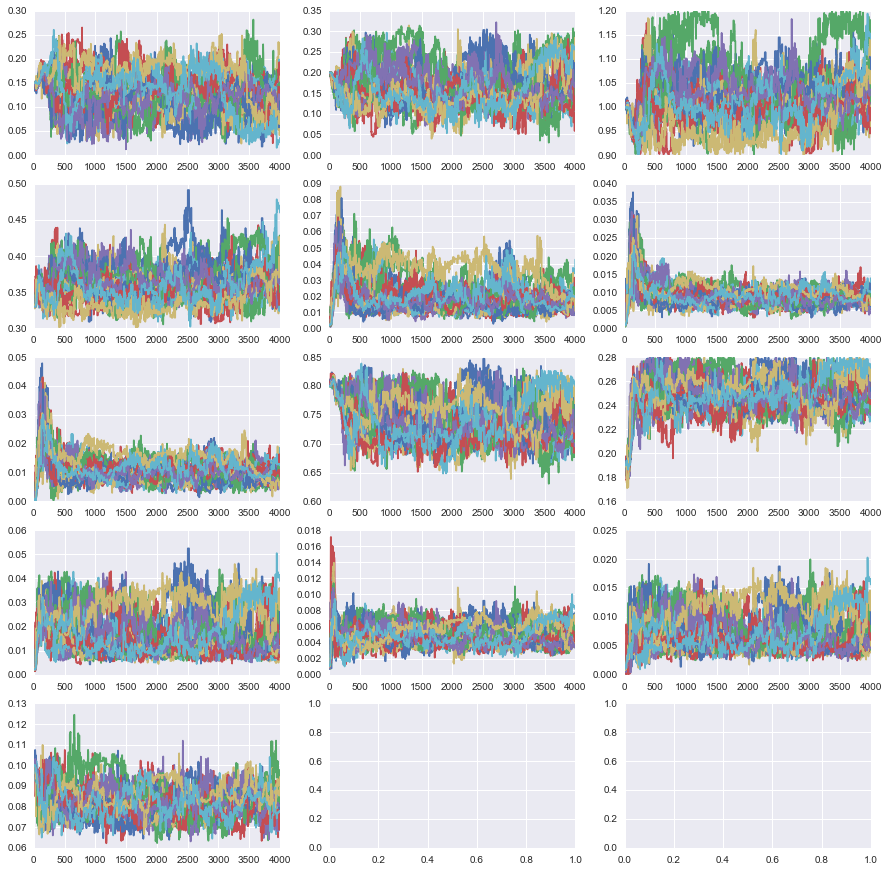

In [617]:
fig,ax = plt.subplots(figsize=(15,15),ncols=3,nrows=5,dpi=1000)

for i in range(gc_sampler_space_bimodal.n_dim):
    for j in range(30):
        ax[i/3,i%3].plot(gc_sampler_space_bimodal.sampler.chain[j+30,:,i])

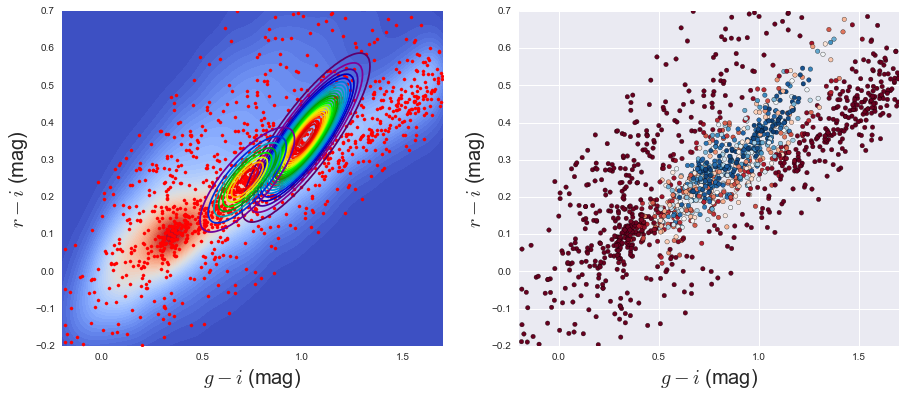

In [619]:
nburn = 3000
sampler = gc_sampler_space_bimodal
chain = sampler.chain
mean_red = np.array([np.median(chain[:,nburn:,2].reshape(-1,100)),np.median(chain[:,nburn:,3].reshape(-1,100))])
mean_blue = np.array([np.median(chain[:,nburn:,7].reshape(-1,100)),np.median(chain[:,nburn:,8].reshape(-1,100))])

cov_red = np.matrix([[np.median(chain[:,nburn:,4].reshape(-1,100)),np.median(chain[:,nburn:,6].reshape(-1,100))],
                   [np.median(chain[:,nburn:,6].reshape(-1,100)),np.median(chain[:,nburn:,5].reshape(-1,100))]])
cov_blue = np.matrix([[np.median(chain[:,nburn:,9].reshape(-1,100)),np.median(chain[:,nburn:,11].reshape(-1,100))],
                   [np.median(chain[:,nburn:,11].reshape(-1,100)),np.median(chain[:,nburn:,10].reshape(-1,100))]])

red_pdf = stats.multivariate_normal(mean=mean_red,cov=cov_red)
blue_pdf = stats.multivariate_normal(mean=mean_blue,cov=cov_blue)

red_probs = red_pdf.pdf(xy)
red_max = red_pdf.pdf(mean_red)
blue_probs = blue_pdf.pdf(xy)
blue_max = blue_pdf.pdf(mean_blue)
red_levels = np.linspace(0, red_max, 25)
blue_levels = np.linspace(0, blue_max, 10)

fig,ax = plt.subplots(1,2,figsize=(15,6))
red_contours = red_probs.reshape(X.shape)
blue_contours = blue_probs.reshape(X.shape)
contour = ax[0].contour(X, Y, red_contours, levels=red_levels, cmap=plt.cm.spectral)
contour = ax[0].contour(X, Y, blue_contours, levels=blue_levels, cmap=plt.cm.spectral)
contour = ax[0].contourf(X, Y, Z, levels=levels, cmap=plt.cm.coolwarm)

ax[0].set_xlim(-0.2,1.7)
ax[0].set_ylim(-0.2,0.7)
ax[0].scatter(gi[g],ri[g],
           s=10.0,color='red')
ax[0].set_xlabel(r'$g-i$ (mag)',size=20)
ax[0].set_ylabel(r'$r-i$ (mag)',size=20)

ax[1].scatter(cat[0][:,0],cat[0][:,1],c=sampler.p_gc,cmap='RdBu',vmax=1)
ax[1].set_xlim(-0.2,1.7)
ax[1].set_ylim(-0.2,0.7)
ax[1].set_xlabel(r'$g-i$ (mag)',size=20)
ax[1].set_ylabel(r'$r-i$ (mag)',size=20)

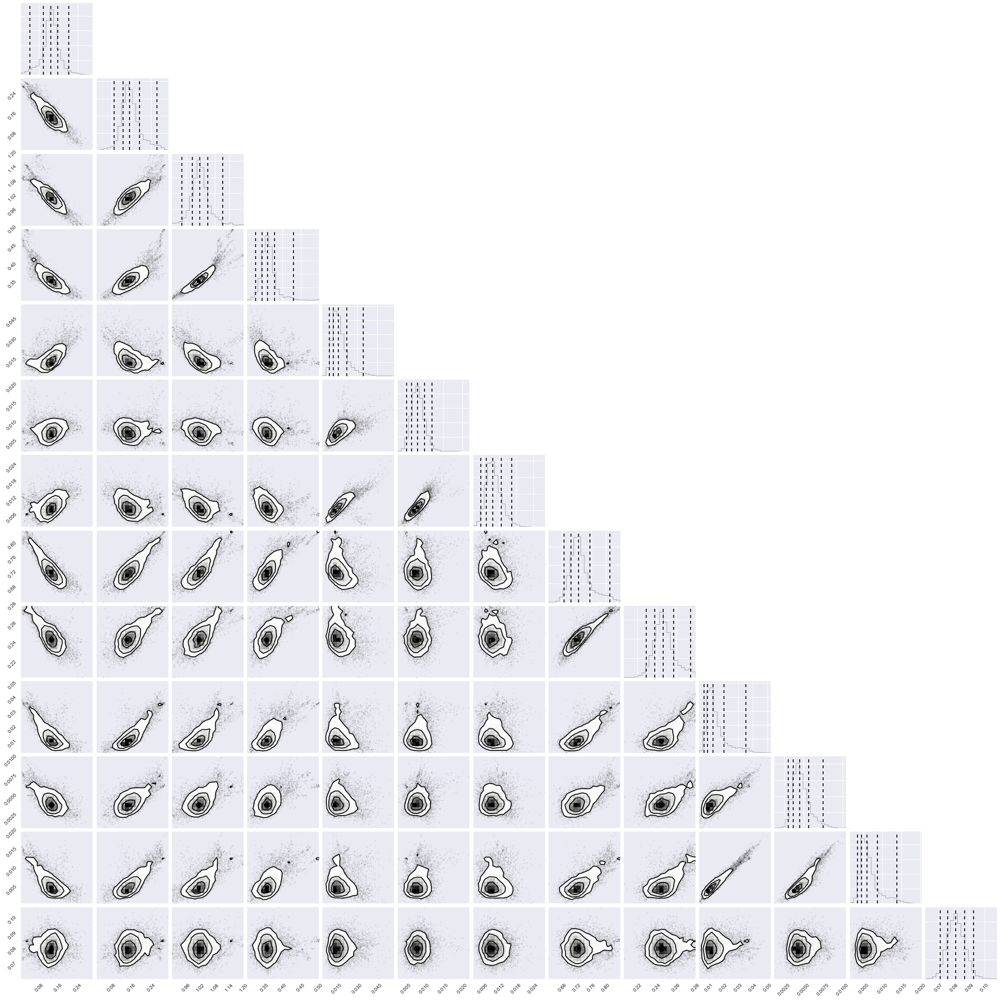

In [620]:
import corner

fig = corner.corner(sampler.sampler.chain[:,3000::10,:].reshape(-1,sampler.n_dim),
                     quantiles=[0.025,0.16, 0.5, 0.84,0.975])#,\
                     #labels=[r'$f_{gc}$',r'$\mu_{gi}$',r'$\mu_{ri}$',r'$\sigma_{gi}$',
                     #        r'$\sigma_{ri}$',r'$\sigma_{gi}\sigma_{ri}$',r'$R_e$',r'$\mu_i$',r'$\sigma_i$'],
                   #label_kwargs={"fontsize": 24},color='black')

#fig.savefig('realistic_model_corner_complete.pdf',bbox_inches='tight')

### Now sample unimodal but with spatial and luminosity 

In [621]:
reload(gcSampler)
reload(densityGC)
reload(densityFG)

gc_sampler_space_lum_single = gcSampler.gcSampler(100.,catalog=cat,\
                fractions=np.array([0.4,0.6]),center=[c_ra,c_dec],spatial=np.array([0.1]),\
                max_rad=0.25,radial_profile='exponential',mock=False,n_source=1000,ellipticity=False,\
                n_pop=1,fixed_cov=False,fixed_means=False,fixed_lum=False,lum_function='mag_only',
                completeness=None,fg_faint=np.max(cat[1]),incomplete=False,
                fg_kde_file='../final_fg_distribution/ngvs_bg_trimmed_kde_full_bw.05_seeing_.7_xl.p',
                fg_bright=18.,lum_mean=np.array([23.]),lum_sig=np.array([1.0]),\
                gi_offset=0.0,ri_offset=0.0,c_blue=c_blue,c_red=c_red,re_norm=True,gi_divide=0.9,\
                ri_divide=0.28,means=np.array([[1.0,0.33],[0.7,0.19]]),
                fg_mag_kde_file='../final_fg_distribution/ngvs_bg2_i_fg_mag_kde.p',
                fg_mag_complete_file='../ngvs_bg_2/ngvs_bg_2_i_completeness.p')

In [622]:
gc_sampler_space_lum_single.runSampler(2000.,burn_steps=0.)

/Users/zjennings/google_drive_personal/gc_select/gcSampler.py:728: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  self.chain=self.sampler.chain[:,burn_steps:,:]
/Users/zjennings/google_drive_personal/gc_select/gcSampler.py:749: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  flat_chain = self.chain[:,n_burn:,:].reshape(-1,self.n_dim)


/Users/zjennings/anaconda/envs/astro/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


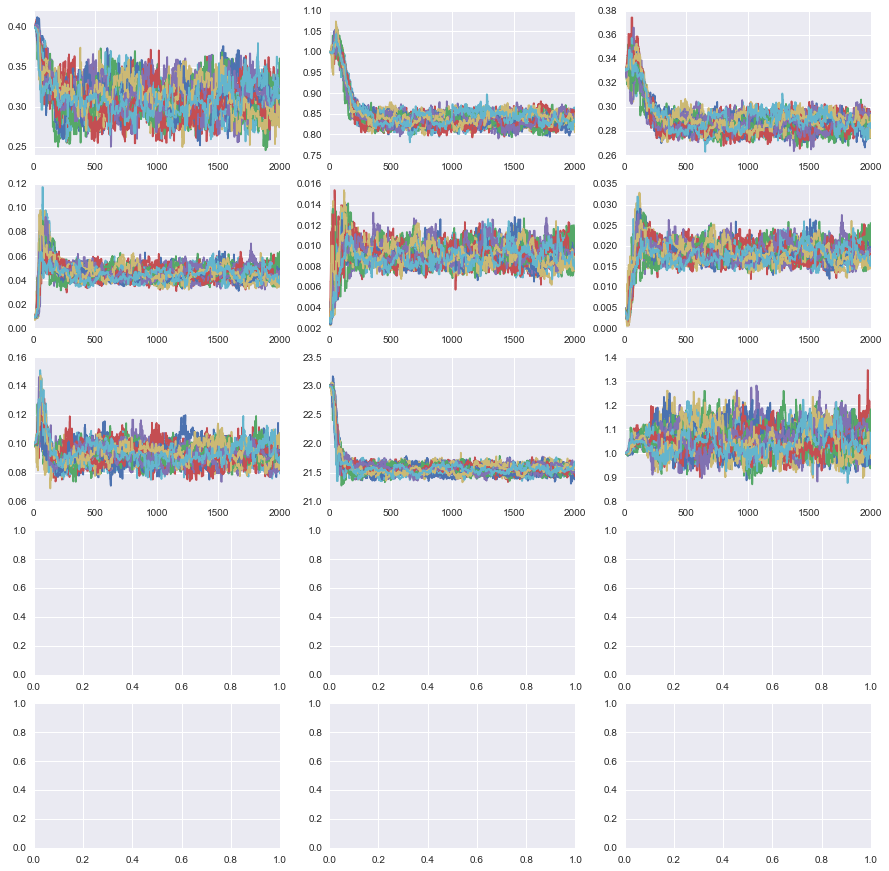

In [623]:
fig,ax = plt.subplots(figsize=(15,15),ncols=3,nrows=5,dpi=1000)

for i in range(gc_sampler_space_lum_single.n_dim):
    for j in range(30):
        ax[i/3,i%3].plot(gc_sampler_space_lum_single.sampler.chain[j,:,i])

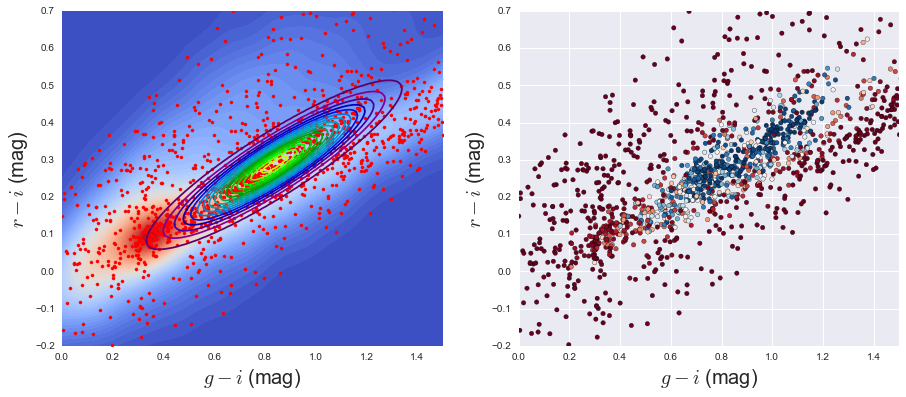

In [624]:
nburn = 1000
sampler = gc_sampler_space_lum_single
chain = sampler.chain
mean_red = np.array([np.median(chain[:,nburn:,1].reshape(-1,100)),np.median(chain[:,nburn:,2].reshape(-1,100))])

cov_red = np.matrix([[np.median(chain[:,nburn:,3].reshape(-1,100)),np.median(chain[:,nburn:,5].reshape(-1,100))],
                   [np.median(chain[:,nburn:,5].reshape(-1,100)),np.median(chain[:,nburn:,4].reshape(-1,100))]])

red_pdf = stats.multivariate_normal(mean=mean_red,cov=cov_red)

red_probs = red_pdf.pdf(xy)
red_max = red_pdf.pdf(mean_red)

fig,ax = plt.subplots(1,2,figsize=(15,6))
red_contours = red_probs.reshape(X.shape)
contour = ax[0].contour(X, Y, red_contours, levels=red_levels, cmap=plt.cm.spectral)
contour = ax[0].contourf(X, Y, Z, levels=levels, cmap=plt.cm.coolwarm)

ax[0].set_xlim(0.0,1.5)
ax[0].set_ylim(-0.2,0.7)
ax[0].scatter(gi[g],ri[g],
           s=10.0,color='red')
ax[0].set_xlabel(r'$g-i$ (mag)',size=20)
ax[0].set_ylabel(r'$r-i$ (mag)',size=20)

ax[1].scatter(cat[0][:,0],cat[0][:,1],c=sampler.p_gc,cmap='RdBu',vmax=1)
ax[1].set_xlim(0.0,1.5)
ax[1].set_ylim(-0.2,0.7)
ax[1].set_xlabel(r'$g-i$ (mag)',size=20)
ax[1].set_ylabel(r'$r-i$ (mag)',size=20)

In [625]:
np.save('space_lum_unimodal_chain.npy',sampler.chain)

### Bimodal data with both spatial and luminosity information

In [659]:
reload(gcSampler)
reload(densityGC)
reload(densityFG)

gc_sampler_space_lum_bimodal = gcSampler.gcSampler(100.,catalog=cat,\
                fractions=np.array([0.15,0.2,0.65]),center=[c_ra,c_dec],spatial=np.array([0.1]),\
                max_rad=0.25,radial_profile='exponential',mock=False,n_source=1000,ellipticity=False,\
                n_pop=2,fixed_cov=False,fixed_means=False,fixed_lum=False,lum_function='mag_only',
                completeness=None,fg_faint=np.max(cat[1]),incomplete=False,
                fg_kde_file='../final_fg_distribution/ngvs_bg_trimmed_kde_full_bw.05_seeing_.7_xl.p',
                fg_bright=18.,lum_mean=np.array([21.5]),lum_sig=np.array([1.0]),\
                gi_offset=0.0,ri_offset=0.0,c_blue=c_blue,c_red=c_red,re_norm=True,gi_divide=0.85,\
                ri_divide=0.28,means=np.array([[0.9,0.33],[0.8,0.19]]),
                fg_mag_kde_file='../final_fg_distribution/ngvs_bg2_i_fg_mag_kde.p',
                fg_mag_complete_file='../ngvs_bg_2/ngvs_bg_2_i_completeness.p',
                cov=np.array([[[0.002, 0.0009],[0.0009, 0.001]],[[0.002, 0.001],[0.001,.001]]]))

In [660]:
gc_sampler_space_lum_bimodal.runSampler(2000.,burn_steps=0.)

/Users/zjennings/google_drive_personal/gc_select/gcSampler.py:728: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  self.chain=self.sampler.chain[:,burn_steps:,:]
/Users/zjennings/google_drive_personal/gc_select/gcSampler.py:749: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  flat_chain = self.chain[:,n_burn:,:].reshape(-1,self.n_dim)


/Users/zjennings/anaconda/envs/astro/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


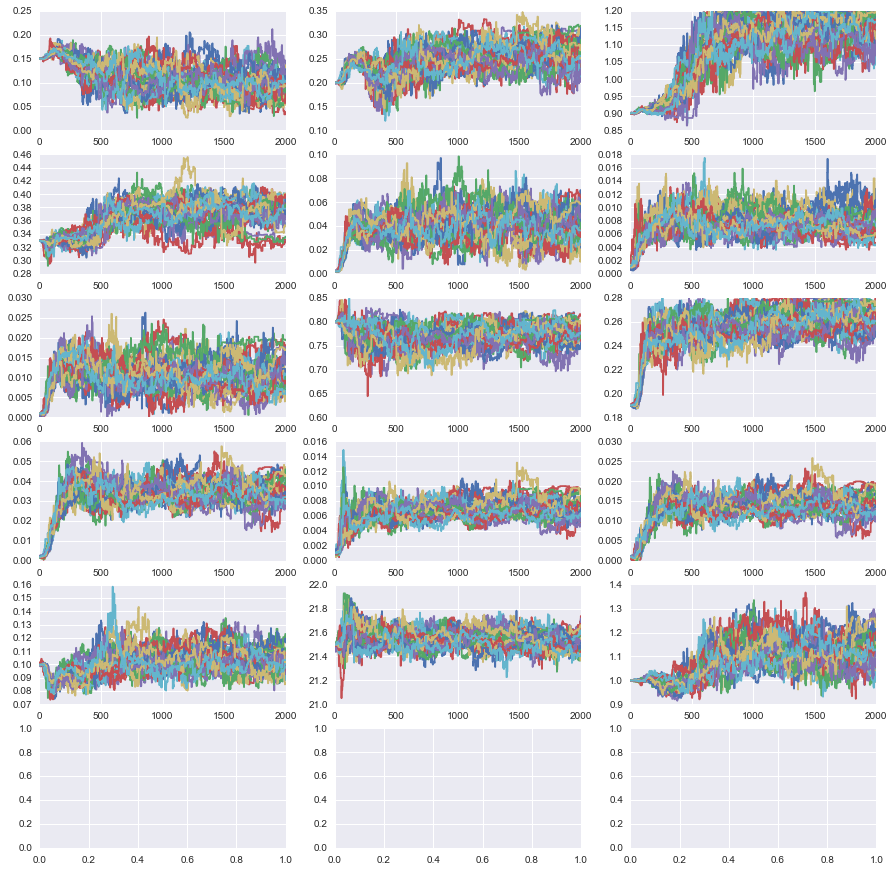

In [661]:
fig,ax = plt.subplots(figsize=(15,15),ncols=3,nrows=6,dpi=1000)

for i in range(gc_sampler_space_lum_bimodal.n_dim):
    for j in range(30):
        ax[i/3,i%3].plot(gc_sampler_space_lum_bimodal.sampler.chain[j,:,i])

In [662]:
nburn = 1000
sampler = gc_sampler_space_lum_bimodal
chain = sampler.chain
mean_red = np.array([np.median(chain[:,nburn:,2].reshape(-1,100)),np.median(chain[:,nburn:,3].reshape(-1,100))])
mean_blue = np.array([np.median(chain[:,nburn:,7].reshape(-1,100)),np.median(chain[:,nburn:,8].reshape(-1,100))])

cov_red = np.matrix([[np.median(chain[:,nburn:,4].reshape(-1,100)),np.median(chain[:,nburn:,6].reshape(-1,100))],
                   [np.median(chain[:,nburn:,6].reshape(-1,100)),np.median(chain[:,nburn:,5].reshape(-1,100))]])
cov_blue = np.matrix([[np.median(chain[:,nburn:,9].reshape(-1,100)),np.median(chain[:,nburn:,11].reshape(-1,100))],
                   [np.median(chain[:,nburn:,11].reshape(-1,100)),np.median(chain[:,nburn:,10].reshape(-1,100))]])

In [663]:
red_pdf = stats.multivariate_normal(mean=mean_red,cov=cov_red)
blue_pdf = stats.multivariate_normal(mean=mean_blue,cov=cov_blue)

red_probs = red_pdf.pdf(xy)
red_max = red_pdf.pdf(mean_red)
blue_probs = blue_pdf.pdf(xy)
blue_max = blue_pdf.pdf(mean_blue)
red_levels = np.linspace(0, red_max, 25)
blue_levels = np.linspace(0, blue_max, 10)

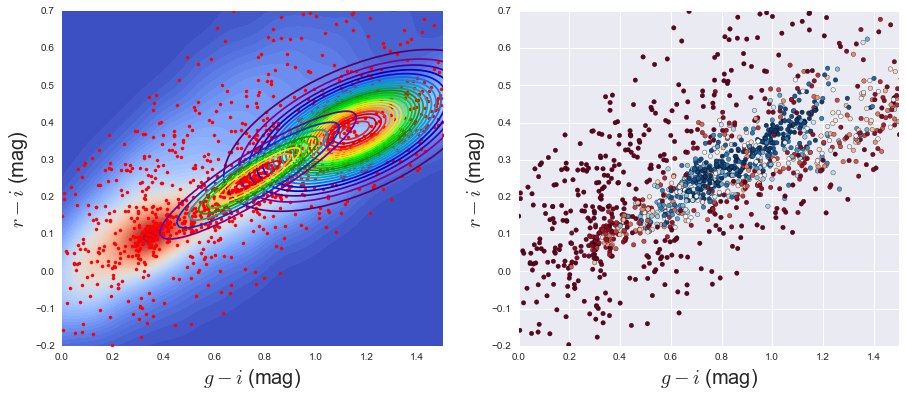

In [664]:
fig,ax = plt.subplots(1,2,figsize=(15,6))
red_contours = red_probs.reshape(X.shape)
blue_contours = blue_probs.reshape(X.shape)
contour = ax[0].contour(X, Y, red_contours, levels=red_levels, cmap=plt.cm.spectral)
contour = ax[0].contour(X, Y, blue_contours, levels=blue_levels, cmap=plt.cm.spectral)
contour = ax[0].contourf(X, Y, Z, levels=levels, cmap=plt.cm.coolwarm)

ax[0].set_xlim(0.0,1.5)
ax[0].set_ylim(-0.2,0.7)
ax[0].scatter(gi[g],ri[g],
           s=10.0,color='red')
ax[0].set_xlabel(r'$g-i$ (mag)',size=20)
ax[0].set_ylabel(r'$r-i$ (mag)',size=20)

ax[1].scatter(cat[0][:,0],cat[0][:,1],c=sampler.p_gc,cmap='RdBu',vmax=1)
ax[1].set_xlim(0.0,1.5)
ax[1].set_ylim(-0.2,0.7)
ax[1].set_xlabel(r'$g-i$ (mag)',size=20)
ax[1].set_ylabel(r'$r-i$ (mag)',size=20)

In [658]:
np.save('space_lum_bimodal_chain.npy',sampler.chain)

#### Everything With Completeness

In [78]:
reload(gcSampler)
reload(densityGC)
reload(densityFG)

gc_sampler_space_lum_bimodal = gcSampler.gcSampler(100.,catalog=cat,\
                fractions=np.array([0.25,0.25,0.5]),center=[c_ra,c_dec],spatial=np.array([0.1]),\
                max_rad=0.25,radial_profile='exponential',mock=False,n_source=1000,ellipticity=False,\
                n_pop=2,fixed_cov=False,fixed_means=False,fixed_lum=False,lum_function='mag_only',
                completeness='mag_only',fg_faint=25.,incomplete=True,
                completeness_file='n3115_i_completeness.p',
                fg_kde_file='../final_fg_distribution/ngvs_bg_trimmed_kde_full_bw.05_seeing_.7_xl.p',
                fg_bright=18.,lum_mean=np.array([21.5]),lum_sig=np.array([1.0]),\
                gi_offset=0.0,ri_offset=0.0,c_blue=c_blue,c_red=c_red,re_norm=True,gi_divide=0.9,\
                ri_divide=0.32,means=np.array([[0.9,0.33],[0.8,0.19]]),
                fg_mag_kde_file='../final_fg_distribution/ngvs_bg2_i_fg_mag_kde.p',
                fg_mag_complete_file='../ngvs_bg_2/ngvs_bg_2_i_completeness.p',
                cov=np.array([[[0.002, 0.001],[0.001, 0.001]],[[0.002, 0.001],[0.001,.001]]]))

In [93]:
gc_sampler_space_lum_bimodal.runSampler(1000.,burn_steps=0.)

/Users/zjennings/google_drive_personal/gc_select/gcSampler.py:729: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  
/Users/zjennings/google_drive_personal/gc_select/gcSampler.py:750: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  


/Users/zjennings/anaconda/envs/astro/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


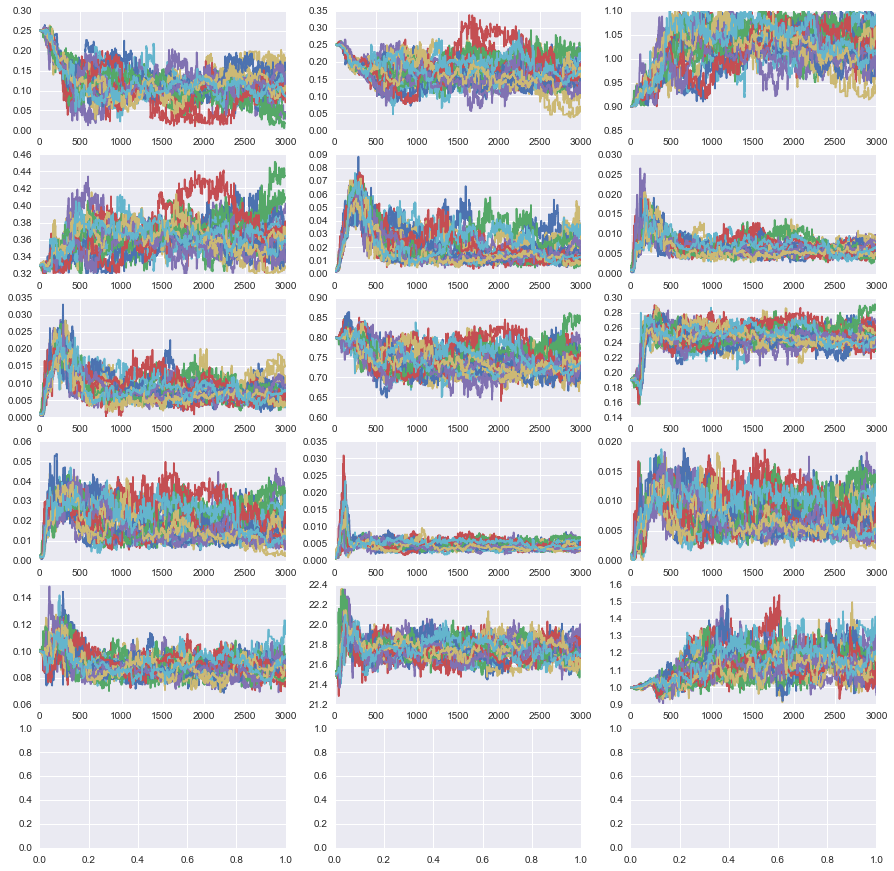

In [94]:
fig,ax = plt.subplots(figsize=(15,15),ncols=3,nrows=6,dpi=1000)

for i in range(gc_sampler_space_lum_bimodal.n_dim):
    for j in range(30):
        ax[i/3,i%3].plot(gc_sampler_space_lum_bimodal.sampler.chain[j,:,i])

In [95]:
nburn = 1000
sampler = gc_sampler_space_lum_bimodal
chain = sampler.chain
mean_red = np.array([np.median(chain[:,nburn:,2].reshape(-1,100)),np.median(chain[:,nburn:,3].reshape(-1,100))])
mean_blue = np.array([np.median(chain[:,nburn:,7].reshape(-1,100)),np.median(chain[:,nburn:,8].reshape(-1,100))])

cov_red = np.matrix([[np.median(chain[:,nburn:,4].reshape(-1,100)),np.median(chain[:,nburn:,6].reshape(-1,100))],
                   [np.median(chain[:,nburn:,6].reshape(-1,100)),np.median(chain[:,nburn:,5].reshape(-1,100))]])
cov_blue = np.matrix([[np.median(chain[:,nburn:,9].reshape(-1,100)),np.median(chain[:,nburn:,11].reshape(-1,100))],
                   [np.median(chain[:,nburn:,11].reshape(-1,100)),np.median(chain[:,nburn:,10].reshape(-1,100))]])

In [96]:
red_pdf = stats.multivariate_normal(mean=mean_red,cov=cov_red)
blue_pdf = stats.multivariate_normal(mean=mean_blue,cov=cov_blue)

red_probs = red_pdf.pdf(xy)
red_max = red_pdf.pdf(mean_red)
blue_probs = blue_pdf.pdf(xy)
blue_max = blue_pdf.pdf(mean_blue)
red_levels = np.linspace(0, red_max, 25)
blue_levels = np.linspace(0, blue_max, 25)

In [97]:
sampler.medians

array([  1.16167637e-01,   1.68110637e-01,   1.02186734e+00,
         3.59830780e-01,   1.55602341e-02,   6.42324069e-03,
         7.83242024e-03,   7.35746509e-01,   2.45964821e-01,
         1.66493132e-02,   4.26522538e-03,   6.59892156e-03,
         8.89041493e-02,   2.17436656e+01,   1.12203699e+00])

In [98]:
red_pdf.pdf([1.2,0.4]) * 0.

0.0

In [99]:
np.exp(sampler.fg.lnLikeColor(1.2,0.4)) * 0.6

/Users/zjennings/anaconda/envs/astro/lib/python3.5/site-packages/sklearn/utils/validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)


array([ 0.69029925])

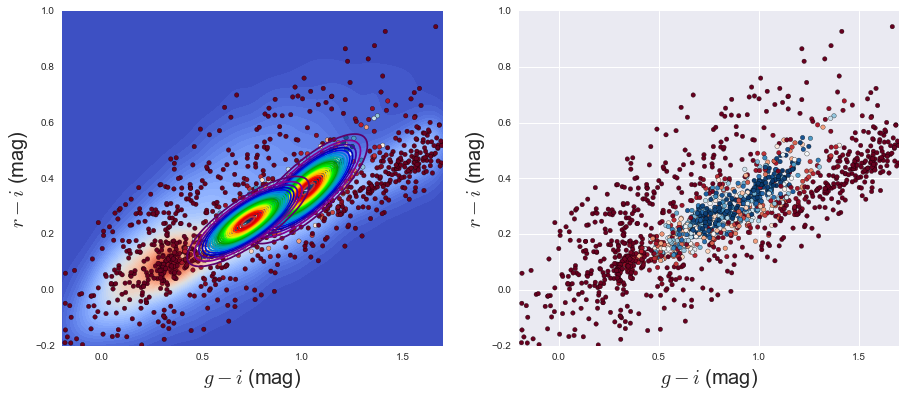

In [102]:
fig,ax = plt.subplots(1,2,figsize=(15,6))
red_contours = red_probs.reshape(X.shape)
blue_contours = blue_probs.reshape(X.shape)
contour = ax[0].contour(X, Y, red_contours, levels=red_levels, cmap=plt.cm.spectral)
contour = ax[0].contour(X, Y, blue_contours, levels=blue_levels, cmap=plt.cm.spectral)
contour = ax[0].contourf(X, Y, Z, levels=levels, cmap=plt.cm.coolwarm)
ax[0].scatter(cat[0][:,0],cat[0][:,1],c=sampler.p_gc,cmap='RdBu',vmax=1)


ax[0].set_xlim(-0.2,1.7)
ax[0].set_ylim(-0.2,1.0)
#ax[0].scatter(gi[g],ri[g],
#           s=10.0,color='red')
ax[0].set_xlabel(r'$g-i$ (mag)',size=20)
ax[0].set_ylabel(r'$r-i$ (mag)',size=20)

ax[1].scatter(cat[0][:,0],cat[0][:,1],c=sampler.p_gc,cmap='RdBu',vmax=1)
#contour = ax[1].contour(X, Y, red_contours, levels=red_levels, cmap=plt.cm.spectral)
ax[1].set_xlim(-0.2,1.7)
ax[1].set_ylim(-0.2,1.0)
ax[1].set_xlabel(r'$g-i$ (mag)',size=20)
ax[1].set_ylabel(r'$r-i$ (mag)',size=20)

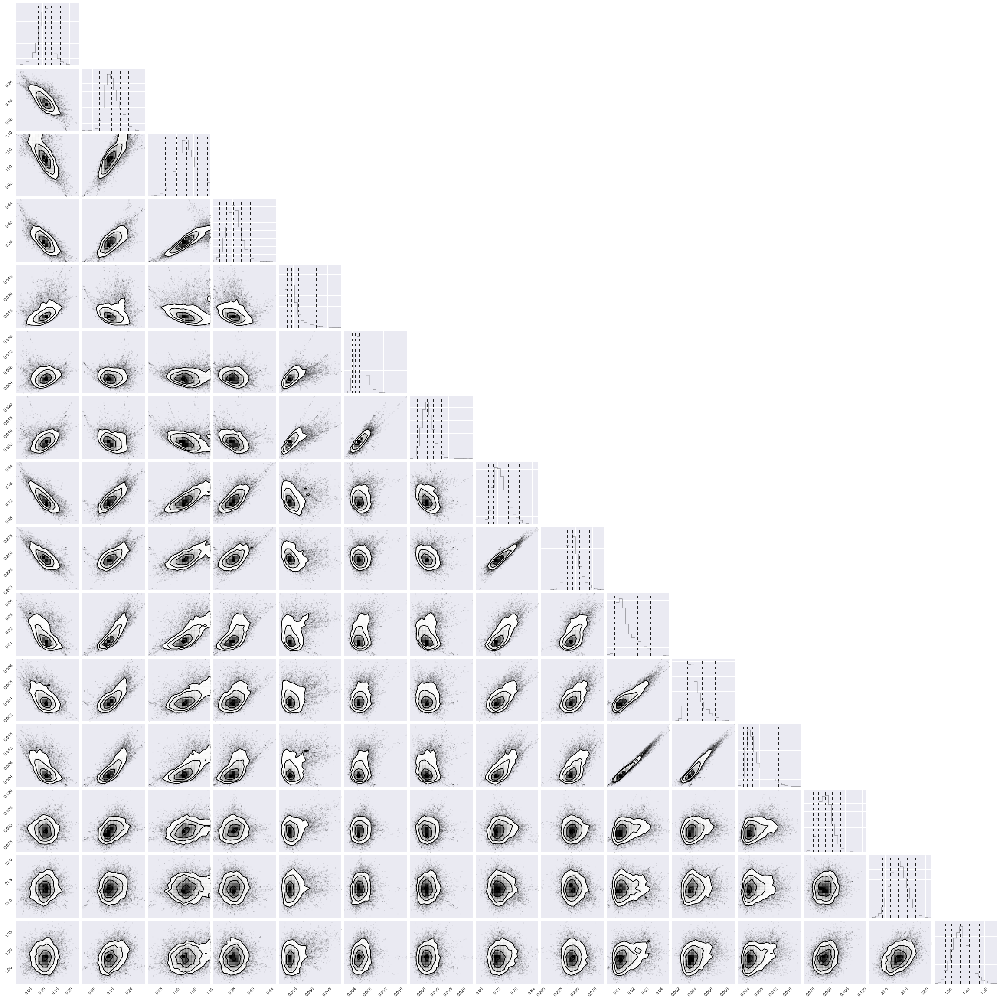

In [104]:
import corner

fig = corner.corner(sampler.sampler.chain[:,2000::5,:].reshape(-1,sampler.n_dim),
                     quantiles=[0.025,0.16, 0.5, 0.84,0.975])#,\
                     #labels=[r'$f_{gc}$',r'$\mu_{gi}$',r'$\mu_{ri}$',r'$\sigma_{gi}$',
                     #        r'$\sigma_{ri}$',r'$\sigma_{gi}\sigma_{ri}$',r'$R_e$',r'$\mu_i$',r'$\sigma_i$'],
                   #label_kwargs={"fontsize": 24},color='black')

#fig.savefig('realistic_model_corner_complete.pdf',bbox_inches='tight')

In [105]:
np.save('space_lum_bimodal_complete_chain.npy',sampler.chain)

In [106]:
foo = np.array([])

(array([  2.,  10.,  11.,  20.,  31.,  53.,  50.,  39.,  38.,  26.,  32.,
         40.,  35.,  28.,  26.,  12.,   6.,   3.,   2.,   2.]),
 array([ 0.43055,  0.47777,  0.52499,  0.57221,  0.61943,  0.66665,
         0.71387,  0.76109,  0.80831,  0.85553,  0.90275,  0.94997,
         0.99719,  1.04441,  1.09163,  1.13885,  1.18607,  1.23329,
         1.28051,  1.32773,  1.37495]),
 <a list of 20 Patch objects>)

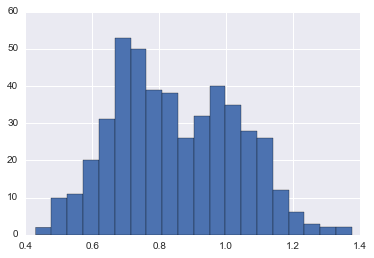

In [107]:
plt.hist(cat[0][:,0][sampler.p_gc > 0.5],bins=20)

In [116]:
blue = (sampler.p_gc > 0.5) & (cat[0][:,0] < 0.9)
red = (sampler.p_gc > 0.5) & (cat[0][:,0] > 0.9)

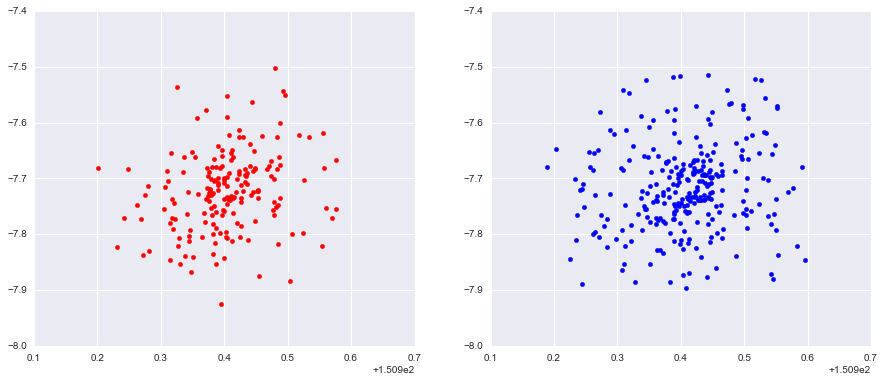

In [122]:
fig,ax = plt.subplots(1,2,figsize=(15,6))
ax[0].scatter(cat[2][0,red],cat[2][1,red],color='r')
ax[1].scatter(cat[2][0,blue],cat[2][1,blue],color='b')

In [125]:
np.median(distance[g][red])

0.075984036603667399

In [126]:
np.median(distance[g][blue])

0.083083835040442144